## Optuna

In [1]:
!pip install optuna


[notice] A new release of pip is available: 25.2 -> 26.1.2
[notice] To update, run: pip install --upgrade pip


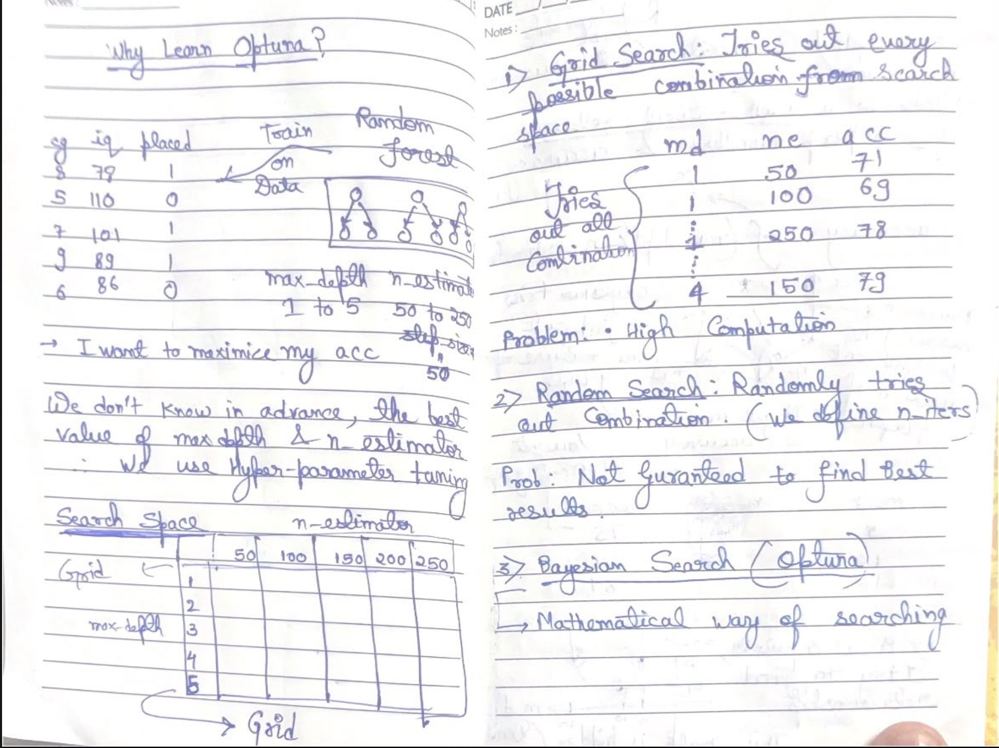

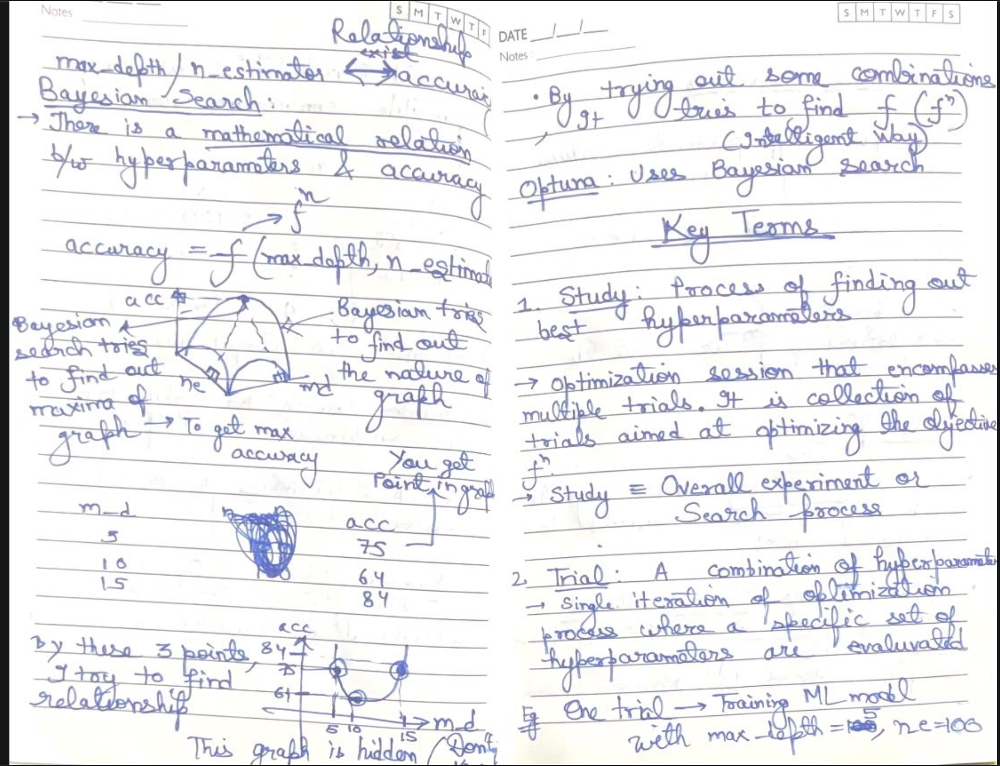

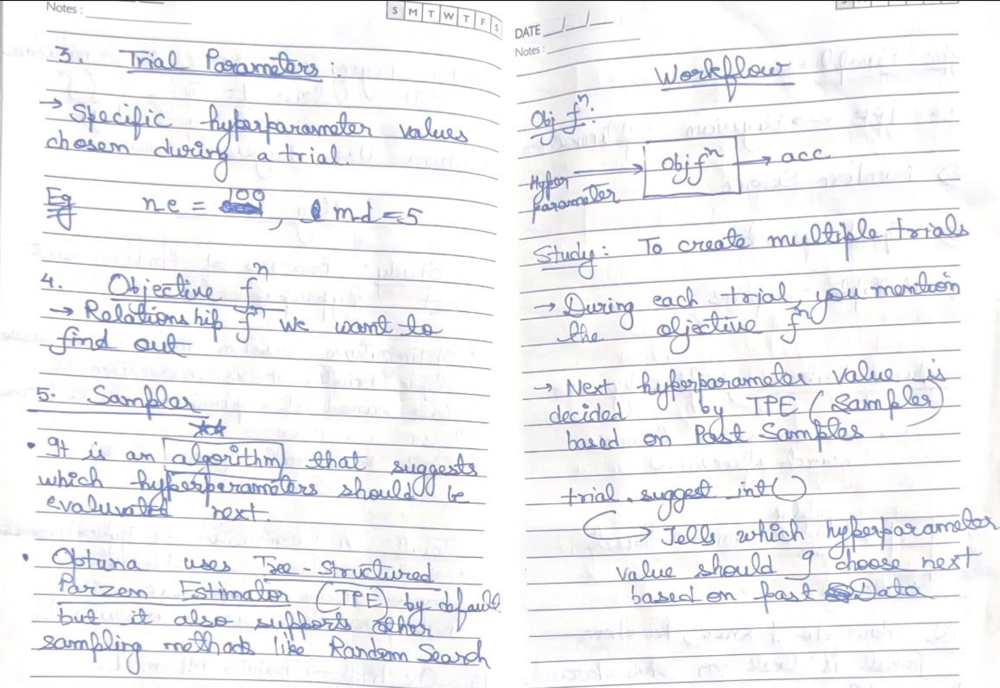

In [2]:
import optuna
from sklearn.datasets import load_diabetes
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np
df=pd.read_csv('/Users/priyanshugupta/Desktop/scikit learn/Datasets/diabetes.csv')
df.head()
## missing values are represented by 0 here

/Users/priyanshugupta/Desktop/scikit learn/.venv/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [3]:
## replace zero values with NAN in columns where zero is not a valid value

cols_with_missing_vals=['Glucose','BloodPressure','SkinThickness','Insulin','BMI']

df[cols_with_missing_vals]=df[cols_with_missing_vals].replace(0,np.nan)


## impute the missing values with the mean of the respective column
df.fillna(df.mean(),inplace=True)

## check if there is any remaining value
print(df.isnull().sum())

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64


In [4]:
## split into feautures X and target y

X=df.drop('Outcome',axis=1)
y=df['Outcome']

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)
scaler=StandardScaler()
X_train=scaler.fit_transform(X_train)
X_test=scaler.transform(X_test)

print(X_train.shape)
print(X_test.shape)

(614, 8)
(154, 8)


In [5]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score

## Define the objective function here
def objective(trial):
    ## Step 1: We define the search space here (Range of values of hyperparameters)
    n_estimators=trial.suggest_int('n_estimators',50,200)
    max_depth=trial.suggest_int('max_depth',3,20)

    ## We have created our search space(grid here)

    ## Step 2: You write the workflow of training the model

    ## create the randomforest with suggested hyperparameters
    model=RandomForestClassifier(
        n_estimators=n_estimators,
        max_depth=max_depth,
        random_state=42
    )

    ## perform 3 fold cross val and cal accuracy
    score=cross_val_score(model,X_train,y_train,cv=3,scoring='accuracy').mean()

    ## Step 3: We return the accuracy score for optuna to maximize
    return score



In [6]:
## we create a study (experiment) object 
# and optimize the objective function

study=optuna.create_study(direction='maximize',sampler=optuna.samplers.TPESampler())
## We aim to maximize the accuracy

study.optimize(objective,n_trials=50)
## Run 50 trials to find the best hyperparameters


[I 2026-07-17 13:46:09,387] A new study created in memory with name: no-name-c366a960-95f1-499e-b5f4-87b6c6e37bee
[I 2026-07-17 13:46:09,499] Trial 0 finished with value: 0.7736170891120676 and parameters: {'n_estimators': 77, 'max_depth': 18}. Best is trial 0 with value: 0.7736170891120676.
[I 2026-07-17 13:46:09,724] Trial 1 finished with value: 0.7589510600988363 and parameters: {'n_estimators': 188, 'max_depth': 4}. Best is trial 0 with value: 0.7736170891120676.
[I 2026-07-17 13:46:09,906] Trial 2 finished with value: 0.7752351347042882 and parameters: {'n_estimators': 133, 'max_depth': 11}. Best is trial 2 with value: 0.7752351347042882.
[I 2026-07-17 13:46:10,078] Trial 3 finished with value: 0.7752191933684043 and parameters: {'n_estimators': 137, 'max_depth': 6}. Best is trial 2 with value: 0.7752351347042882.
[I 2026-07-17 13:46:10,199] Trial 4 finished with value: 0.7719990435198469 and parameters: {'n_estimators': 86, 'max_depth': 18}. Best is trial 2 with value: 0.77523513

In [7]:
## print the best results

print(f"best trial accuracy:{study.best_trial.value}")
print(f"Best Hyperparameters:{study.best_trial.params}")

best trial accuracy:0.7866491311971943
Best Hyperparameters:{'n_estimators': 110, 'max_depth': 13}


In [8]:
from sklearn.metrics import accuracy_score

best_model=RandomForestClassifier(**study.best_trial.params,random_state=42)

best_model.fit(X_train,y_train)
y_pred=best_model.predict(X_test)

accuracy=accuracy_score(y_pred,y_test)
accuracy

0.7532467532467533

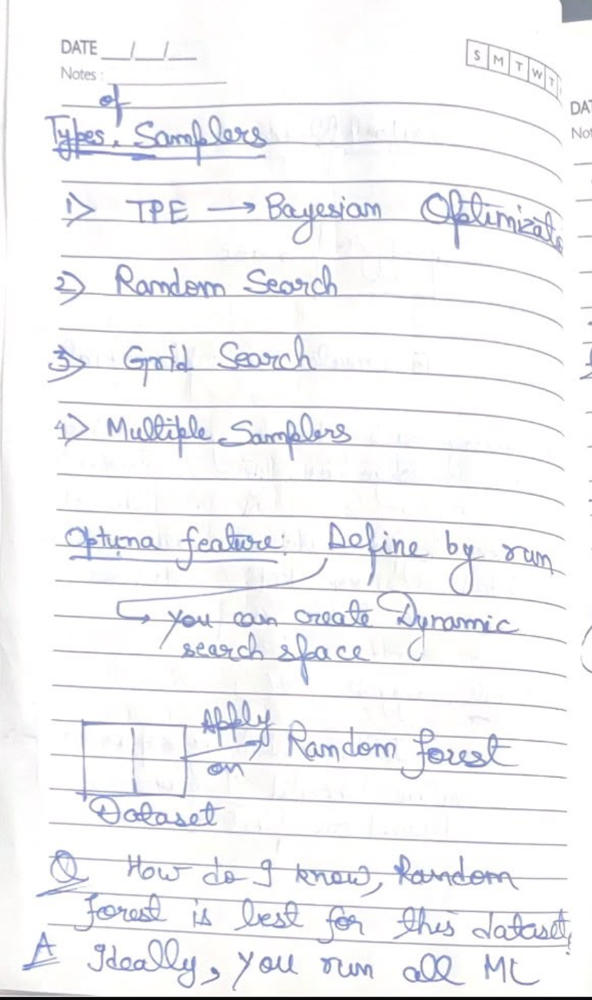

## Samplers in Optuna

In [9]:
def objective(trial):
    n_estimators=trial.suggest_int('n_estimators',50,200)
    max_depth=trial.suggest_int('max_depth',3,20)
    model=RandomForestClassifier(
        n_estimators=n_estimators,
        max_depth=max_depth,
        random_state=42
    )
    score=cross_val_score(model,X_train,y_train,cv=3,scoring='accuracy').mean()
    return score



In [10]:
study=optuna.create_study(direction="maximize",sampler=optuna.samplers.RandomSampler())
study.optimize(objective,n_trials=50)

[I 2026-07-17 13:46:17,970] A new study created in memory with name: no-name-3047f336-db90-4a62-b1c6-a5231aa06d71
[I 2026-07-17 13:46:18,167] Trial 0 finished with value: 0.7784951378925554 and parameters: {'n_estimators': 143, 'max_depth': 12}. Best is trial 0 with value: 0.7784951378925554.
[I 2026-07-17 13:46:18,252] Trial 1 finished with value: 0.75242308305436 and parameters: {'n_estimators': 73, 'max_depth': 3}. Best is trial 0 with value: 0.7784951378925554.
[I 2026-07-17 13:46:18,366] Trial 2 finished with value: 0.7654710664753707 and parameters: {'n_estimators': 85, 'max_depth': 8}. Best is trial 0 with value: 0.7784951378925554.
[I 2026-07-17 13:46:18,635] Trial 3 finished with value: 0.7784951378925554 and parameters: {'n_estimators': 199, 'max_depth': 12}. Best is trial 0 with value: 0.7784951378925554.
[I 2026-07-17 13:46:18,836] Trial 4 finished with value: 0.7866331898613104 and parameters: {'n_estimators': 149, 'max_depth': 13}. Best is trial 4 with value: 0.7866331898

In [11]:
study.best_trial.value

0.7866331898613104

In [12]:
study.best_trial.params

{'n_estimators': 149, 'max_depth': 13}

## Grid Search

In [13]:
search_space={
    'n_estimators':[50,100,150,200],
    'max_depth':[5,10,15,20]
}

In [14]:
## create a study and optimize it using GridSampler

study=optuna.create_study(direction='maximize',sampler=optuna.samplers.GridSampler(search_space))
study.optimize(objective,n_trials=50)

[I 2026-07-17 13:46:25,985] A new study created in memory with name: no-name-a86b7055-ec0d-4545-8fc3-7cba5eee4ac7
[I 2026-07-17 13:46:26,111] Trial 0 finished with value: 0.7654391838036028 and parameters: {'n_estimators': 100, 'max_depth': 5}. Best is trial 0 with value: 0.7654391838036028.
[I 2026-07-17 13:46:26,314] Trial 1 finished with value: 0.776829268292683 and parameters: {'n_estimators': 150, 'max_depth': 10}. Best is trial 1 with value: 0.776829268292683.
[I 2026-07-17 13:46:26,385] Trial 2 finished with value: 0.771975131516021 and parameters: {'n_estimators': 50, 'max_depth': 15}. Best is trial 1 with value: 0.776829268292683.
[I 2026-07-17 13:46:26,523] Trial 3 finished with value: 0.7752351347042882 and parameters: {'n_estimators': 100, 'max_depth': 15}. Best is trial 1 with value: 0.776829268292683.
[I 2026-07-17 13:46:26,661] Trial 4 finished with value: 0.7703491152558585 and parameters: {'n_estimators': 100, 'max_depth': 20}. Best is trial 1 with value: 0.77682926829

In [15]:
study.best_trial.value

0.7817391997449387

In [16]:
study.best_trial.params

{'n_estimators': 50, 'max_depth': 10}

## Optuna Visualization

In [29]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score

## Define the objective function here
def objective(trial):
    ## Step 1: We define the search space here (Range of values of hyperparameters)
    n_estimators=trial.suggest_int('n_estimators',50,200)
    max_depth=trial.suggest_int('max_depth',3,20)

    ## We have created our search space(grid here)

    ## Step 2: You write the workflow of training the model

    ## create the randomforest with suggested hyperparameters
    model=RandomForestClassifier(
        n_estimators=n_estimators,
        max_depth=max_depth,
        random_state=42
    )

    ## perform 3 fold cross val and cal accuracy
    score=cross_val_score(model,X_train,y_train,cv=3,scoring='accuracy').mean()

    ## Step 3: We return the accuracy score for optuna to maximize
    return score


## we create a study (experiment) object 
# and optimize the objective function

study=optuna.create_study(direction='maximize',sampler=optuna.samplers.TPESampler())
## We aim to maximize the accuracy

study.optimize(objective,n_trials=50)
## Run 50 trials to find the best hyperparameters



[I 2026-07-17 13:54:04,172] A new study created in memory with name: no-name-ed4c8c2e-7db4-4b23-a8dc-00cc78fbbd17
[I 2026-07-17 13:54:04,426] Trial 0 finished with value: 0.7589510600988363 and parameters: {'n_estimators': 191, 'max_depth': 4}. Best is trial 0 with value: 0.7589510600988363.
[I 2026-07-17 13:54:04,626] Trial 1 finished with value: 0.7752032520325204 and parameters: {'n_estimators': 166, 'max_depth': 5}. Best is trial 1 with value: 0.7752032520325204.
[I 2026-07-17 13:54:04,766] Trial 2 finished with value: 0.771983102183963 and parameters: {'n_estimators': 99, 'max_depth': 20}. Best is trial 1 with value: 0.7752032520325204.
[I 2026-07-17 13:54:05,030] Trial 3 finished with value: 0.7735772357723577 and parameters: {'n_estimators': 180, 'max_depth': 10}. Best is trial 1 with value: 0.7752032520325204.
[I 2026-07-17 13:54:05,294] Trial 4 finished with value: 0.780113183484776 and parameters: {'n_estimators': 188, 'max_depth': 16}. Best is trial 4 with value: 0.780113183

In [30]:
## For visualizations

from optuna.visualization import plot_optimization_history
from optuna.visualization import plot_param_importances
from optuna.visualization import plot_slice
from optuna.visualization import plot_parallel_coordinate
from optuna.visualization import plot_contour


## 1.Optimization History


In [ ]:
from optuna.visualization import plot_optimization_history
plot_optimization_history(study).show()

 objective value is our accuracy
 
as we go with no of trials , the accuracy is also increasing

## 2.Parallel Coordinates plot


In [33]:
plot_parallel_coordinate(study).show()
## this plot helps you to understand the realtionship btw accuracy, 
# max depth and estimator

 darker color lines mean higher objective(accuracy) value

## 3.slice plot


In [ ]:
plot_slice(study).show()

 shows the relationship between a hyperparameter value and objective function

## 4.Contour plot


In [36]:
plot_contour(study).show()

We can identify the regions where the accuracy is maximum

We can identify the hotspots

## 5. plot param importances

In [ ]:
plot_param_importances(study).show()

Shows which Hyperparameters are more important compared to others

## Optimizing Multiple ML Models

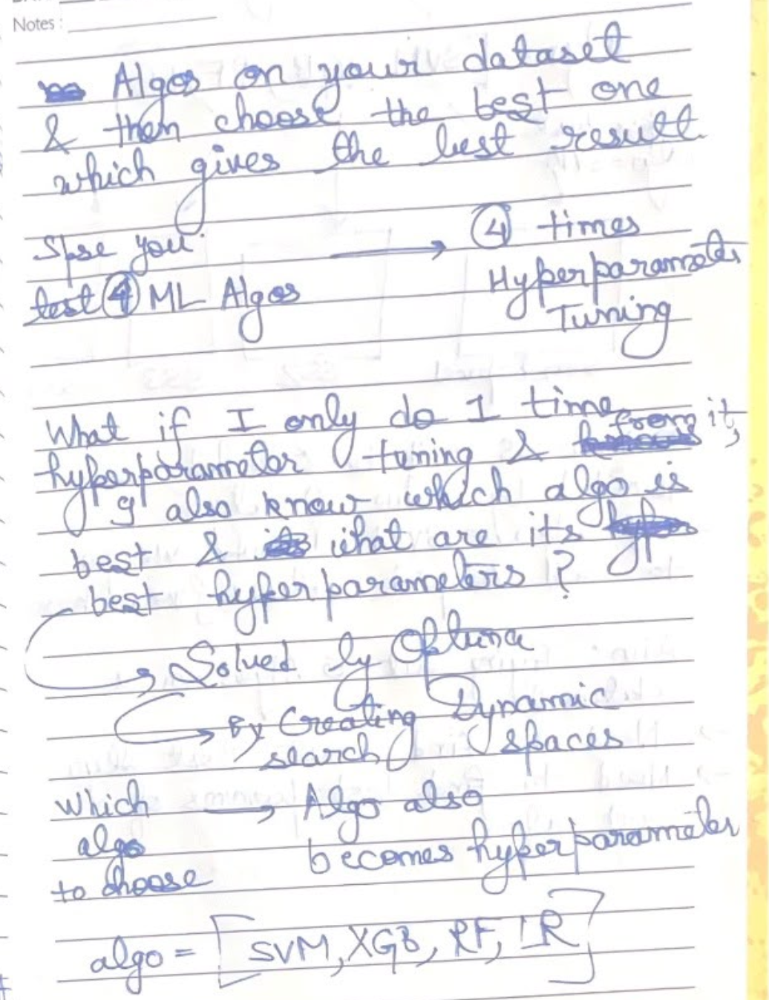

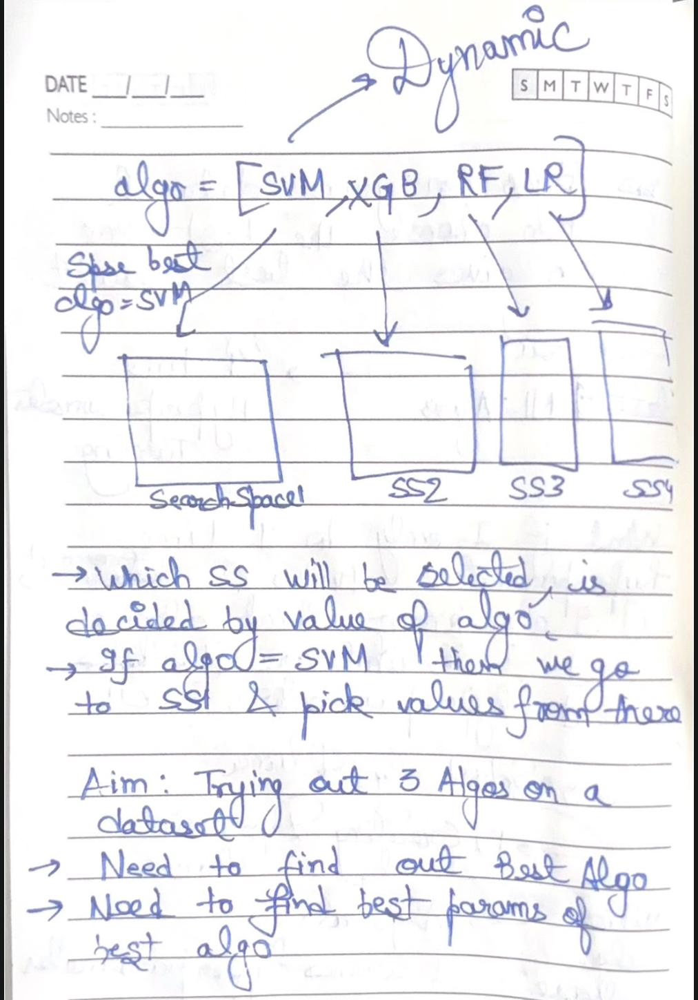

In [56]:
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier
from sklearn.svm import SVC

In [58]:
## Define the objective function
def objective(trial):
    classifier_name=trial.suggest_categorical("classifier",['SVM','RandomForest','GradientBoosting'])

    if classifier_name=='SVM':
        ## SVM Hyperparameters
        c=trial.suggest_float("C",0.1,100,log=True)
        kernel=trial.suggest_categorical("kernel",['linear','rbf','poly','sigmoid'])
        gamma=trial.suggest_categorical("gamma",['scale','auto'])
        model=SVC(C=c,kernel=kernel,gamma=gamma,random_state=42)
    
    elif classifier_name=='RandomForest':
        ## RandomForest Hyperparameters
        n_estimators=trial.suggest_int("n_estimators",50,300)
        max_depth=trial.suggest_int("max_depth",3,20)
        min_samples_split=trial.suggest_int("min_samples_split",2,10)
        min_samples_leaf=trial.suggest_int("min_samples_leaf",1,10)
        bootstrap=trial.suggest_categorical("bootstrap",[True,False])

        model=RandomForestClassifier(max_depth=max_depth,n_estimators=n_estimators,min_samples_leaf=min_samples_leaf,min_samples_split=min_samples_split,random_state=42)

    elif classifier_name=='GradientBoosting':
        ## Gradient Boosting Hyperparameters
        n_estimators=trial.suggest_int("n_estimators",50,300)
        learning_rate=trial.suggest_float("learning_rate",0.01,0.3,log=True)
        max_depth=trial.suggest_int("max_depth",3,20)
        min_samples_split=trial.suggest_int("min_samples_split",2,10)
        min_samples_leaf=trial.suggest_int("min_samples_leaf",1,10)
        model=GradientBoostingClassifier(n_estimators=n_estimators,learning_rate=learning_rate,
                                         max_depth=max_depth,min_samples_leaf=min_samples_leaf,
                                         min_samples_split=min_samples_split,random_state=42)
    ## Perform cross validation and return the accuracy
    score=cross_val_score(model,X_train,y_train,cv=3,scoring='accuracy').mean()
    return score


In [59]:
study=optuna.create_study(direction="maximize")
study.optimize(objective,n_trials=100)

[I 2026-07-17 14:42:49,768] A new study created in memory with name: no-name-e4ebd936-4687-484c-ab07-17371edd26ae
[I 2026-07-17 14:42:49,837] Trial 0 finished with value: 0.7019209309740155 and parameters: {'classifier': 'SVM', 'C': 73.07848553876862, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 0 with value: 0.7019209309740155.
[I 2026-07-17 14:42:49,853] Trial 1 finished with value: 0.7068228917583292 and parameters: {'classifier': 'SVM', 'C': 20.519248233509664, 'kernel': 'poly', 'gamma': 'auto'}. Best is trial 1 with value: 0.7068228917583292.
[I 2026-07-17 14:42:49,869] Trial 2 finished with value: 0.7686991869918699 and parameters: {'classifier': 'SVM', 'C': 4.9608665758611235, 'kernel': 'linear', 'gamma': 'auto'}. Best is trial 2 with value: 0.7686991869918699.
[I 2026-07-17 14:42:49,935] Trial 3 finished with value: 0.7735772357723577 and parameters: {'classifier': 'RandomForest', 'n_estimators': 50, 'max_depth': 7, 'min_samples_split': 9, 'min_samples_leaf': 8, 'bootstra

In [62]:
study.best_trial.params

{'classifier': 'RandomForest',
 'n_estimators': 159,
 'max_depth': 8,
 'min_samples_split': 10,
 'min_samples_leaf': 5,
 'bootstrap': False}

In [63]:
study.best_trial.value

0.7817471704128806

In [ ]:
study.trials_dataframe() ## 100 trials data in a dataframe

,number,value,datetime_start,datetime_complete,duration,params_C,params_bootstrap,params_classifier,params_gamma,params_kernel,params_learning_rate,params_max_depth,params_min_samples_leaf,params_min_samples_split,params_n_estimators,state
0,0,0.701921,2026-07-17 14:42:49.770669,2026-07-17 14:42:49.837669,0 days 00:00:00.067000,73.078486,NaN,SVM,scale,poly,NaN,NaN,NaN,NaN,NaN,COMPLETE
1,1,0.706823,2026-07-17 14:42:49.838012,2026-07-17 14:42:49.853923,0 days 00:00:00.015911,20.519248,NaN,SVM,auto,poly,NaN,NaN,NaN,NaN,NaN,COMPLETE
2,2,0.768699,2026-07-17 14:42:49.854249,2026-07-17 14:42:49.869194,0 days 00:00:00.014945,4.960867,NaN,SVM,auto,linear,NaN,NaN,NaN,NaN,NaN,COMPLETE
3,3,0.773577,2026-07-17 14:42:49.869551,2026-07-17 14:42:49.935021,0 days 00:00:00.065470,NaN,False,RandomForest,NaN,NaN,NaN,7.0,8.0,9.0,50.0,COMPLETE
4,4,0.744309,2026-07-17 14:42:49.935355,2026-07-17 14:42:50.621275,0 days 00:00:00.685920,NaN,NaN,GradientBoosting,NaN,NaN,0.045803,16.0,10.0,2.0,216.0,COMPLETE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,95,0.781723,2026-07-17 14:43:12.769260,2026-07-17 14:43:13.003240,0 days 00:00:00.233980,NaN,False,RandomForest,NaN,NaN,NaN,8.0,6.0,10.0,182.0,COMPLETE
96,96,0.778479,2026-07-17 14:43:13.003576,2026-07-17 14:43:13.267661,0 days 00:00:00.264085,NaN,False,RandomForest,NaN,NaN,NaN,8.0,6.0,10.0,154.0,COMPLETE
97,97,0.781731,2026-07-17 14:43:13.268018,2026-07-17 14:43:13.473218,0 days 00:00:00.205200,NaN,False,RandomForest,NaN,NaN,NaN,8.0,6.0,10.0,152.0,COMPLETE
98,98,0.780105,2026-07-17 14:43:13.473554,2026-07-17 14:43:13.672727,0 days 00:00:00.199173,NaN,False,RandomForest,NaN,NaN,NaN,8.0,6.0,10.0,150.0,COMPLETE


In [65]:
study.trials_dataframe()['params_classifier'].value_counts()

params_classifier
RandomForest        79
SVM                 11
GradientBoosting    10
Name: count, dtype: int64

In [66]:
study.trials_dataframe().groupby('params_classifier')['value'].mean()

params_classifier
GradientBoosting    0.752767
RandomForest        0.772773
SVM                 0.729635
Name: value, dtype: float64

In [67]:
## 1.Optimization History

## For visualizations

from optuna.visualization import plot_optimization_history
from optuna.visualization import plot_param_importances
from optuna.visualization import plot_slice
from optuna.visualization import plot_parallel_coordinate
from optuna.visualization import plot_contour


In [68]:
from optuna.visualization import plot_optimization_history
plot_optimization_history(study).show()

In [70]:
plot_contour(study).show()

/var/folders/gg/f1jqwyw902s1lt078gd0wfdm0000gn/T/ipykernel_72742/2669447035.py:1: UserWarning: Contour plot will not be displayed because `C` and `bootstrap` cannot co-exist in `trial.params`.
  plot_contour(study).show()
/var/folders/gg/f1jqwyw902s1lt078gd0wfdm0000gn/T/ipykernel_72742/2669447035.py:1: UserWarning: Contour plot will not be displayed because `C` and `learning_rate` cannot co-exist in `trial.params`.
  plot_contour(study).show()
/var/folders/gg/f1jqwyw902s1lt078gd0wfdm0000gn/T/ipykernel_72742/2669447035.py:1: UserWarning: Contour plot will not be displayed because `C` and `max_depth` cannot co-exist in `trial.params`.
  plot_contour(study).show()
/var/folders/gg/f1jqwyw902s1lt078gd0wfdm0000gn/T/ipykernel_72742/2669447035.py:1: UserWarning: Contour plot will not be displayed because `C` and `min_samples_leaf` cannot co-exist in `trial.params`.
  plot_contour(study).show()
/var/folders/gg/f1jqwyw902s1lt078gd0wfdm0000gn/T/ipykernel_72742/2669447035.py:1: UserWarning: Contou